In [1]:
include("harvey.jl")
using .julia


using Random
using LinearAlgebra
using Statistics
using Distributions
using ProgressMeter
using SpecialFunctions


using NLopt

using Plots
using StatsPlots  
using Distributions
using DataFrames

## Simulate

In [2]:
# Define initial state and covariance
n_order = 2  # Adjust based on your model
state_dim = 2 + 2 * n_order
alpha_init = zeros(state_dim)
P1 = Matrix{Float64}(I(state_dim))*100  # Initial covariance matrix

# True parameters for simulation
rho = 0.6
lambda_c = 1.5
sigma_xi2 = 0.7
sigma_kappa2 = 0.33
sigma_epsilon2 = 0.5
params_true = [rho, lambda_c, sigma_xi2, sigma_kappa2, sigma_epsilon2]

n_obs = 150  # Number of observations

# Simulate data
y, alpha = simulate_data(params_true, n_order, n_obs, alpha_init)


([-0.45660053706486897, 0.34807026295178434, -3.105594272385593, -1.8645104809657806, 0.8473592922236203, -1.8509155452253483, -5.182677231565297, -7.957061632203736, -8.590632973237048, -6.820265703956122  …  -1223.914252560934, -1244.7973672612272, -1265.8245585790896, -1288.3078682496332, -1307.0139444921197, -1326.9381514271179, -1348.3950655433266, -1371.1975836489096, -1391.177026809122, -1409.3059814377382], [0.0 0.0 … 0.0 0.0; 0.0 -1.2242439374872276 … 0.0 0.0; … ; -1389.5560389751918 -20.59838693703914 … -1.3385011397969615 2.22238157460047; -1410.1544259122309 -21.836035554181727 … 1.0824214633682798 1.8031126724171422])

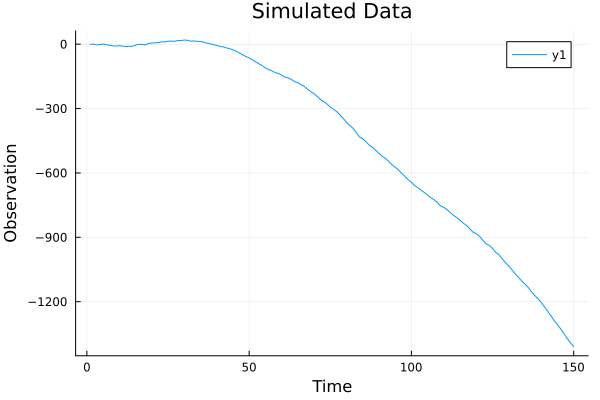

In [3]:
using Plots

plot(y, title="Simulated Data", xlabel="Time", ylabel="Observation")


## Estimate

In [4]:
#Define model
n_order = n_order
state_dim = 2 + 2 * n_order
alpha_init = zeros(state_dim)
alpha_init[1] = y[1]
P1 = Matrix{Float64}(I(state_dim))*100  # Initial covariance matrix

#Priors
a_rho = 0.01
b_rho = 0.97
a_lambda = 0.01
b_lambda = π
a_xi = 1e-6
b_xi = 1e6
a_kappa = 1e-6
b_kappa = 1e6
a_epsilon = 1e-6  
b_epsilon = 1e6
priors = [a_rho, b_rho, a_lambda, b_lambda, a_xi, b_xi, a_kappa, b_kappa, a_epsilon, b_epsilon]




10-element Vector{Float64}:
 0.01
 0.97
 0.01
 3.141592653589793
 1.0e-6
 1.0e6
 1.0e-6
 1.0e6
 1.0e-6
 1.0e6

In [5]:
# Run MCMC initialization
chain_init_burned, Sigma, acceptance_rate_init, chain_init = initialize_mcmc(
    y,
    priors,
    alpha_init, 
    P1, 
    n_order; 
    n_init=40000, 
    burn_init=20000, 
    omega_init=0.03)


Initialization Phase 100%|███████████████████████████████| Time: 0:00:16


Initialization Acceptance Rate: 33.582499999999996 %


([-0.19985202974905575 0.05667263481372464 … -13.94744282823686 -16.8507167799615; -0.19985202974905575 0.05667263481372464 … -13.94744282823686 -16.8507167799615; … ; -0.3270276096828635 -0.03453546735841971 … -13.852173971545886 -15.804270250174232; -0.33283426101638275 -0.18127330495315924 … -13.561617903043322 -15.862376233692032], [0.07894686215573603 0.01629460759840199 … -0.09320787302073322 0.09619056208884334; 0.01629460759840199 0.020247461516402495 … -0.02294620647970639 -0.014752091177171476; … ; -0.09320787302073322 -0.02294620647970639 … 0.15936923866108227 -0.22139129817661798; 0.09619056208884334 -0.014752091177171476 … -0.22139129817661798 1.5202989807585587], 0.335825, [-0.22993432850911003 0.3277280235025284 … 0.08363150088679164 -0.00941380715304811; -0.22993432850911003 0.3277280235025284 … 0.08363150088679164 -0.00941380715304811; … ; -0.3270276096828635 -0.03453546735841971 … -13.852173971545886 -15.804270250174232; -0.33283426101638275 -0.18127330495315924 … -13

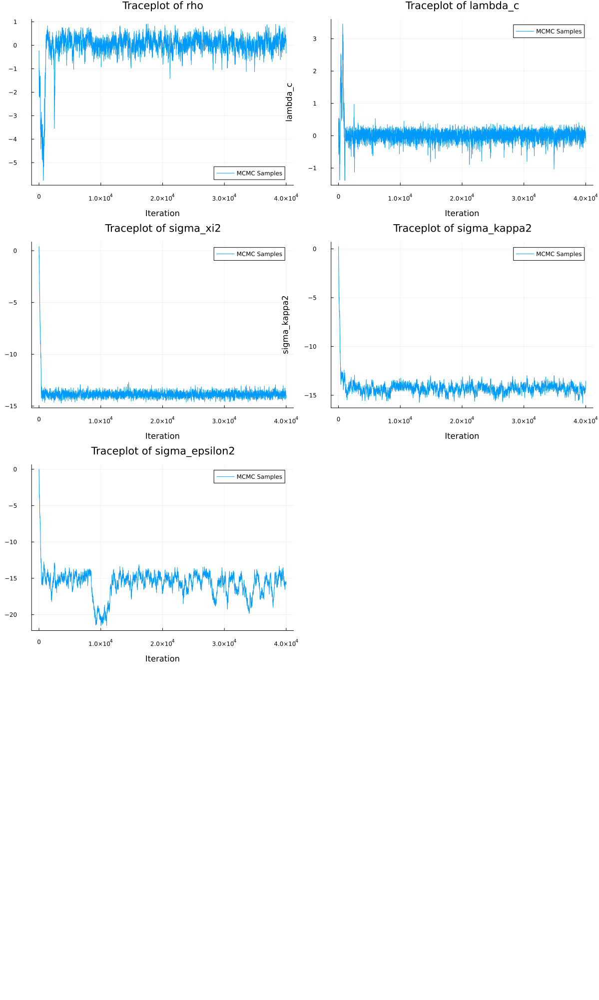

In [6]:
parameters = ["rho", "lambda_c", "sigma_xi2", "sigma_kappa2", "sigma_epsilon2"]
n_params = length(parameters)


# Initialize a list to hold the plots
p_list = []

for i in 1:n_params
    param_samples_init = chain_init[:, i]
    
    
    # Traceplot of MCMC samples
    p2 = plot(param_samples_init, label="MCMC Samples", xlabel="Iteration", ylabel=parameters[i],
              title="Traceplot of $(parameters[i])")

    
    # Add plots to the list
    push!(p_list, p2)
end

# Display the plots in a grid layout
nrows = n_params
ncols = 2
plot(p_list..., layout=(nrows, ncols), size=(1200, 400 * n_params))


In [7]:
# Run MCMC recursion
theta_samples_burned, alpha_samples, acceptance_rate_rec = recursion_mcmc(
    y, 
    priors,
    alpha_init, 
    P1, 
    n_order, 
    chain_init_burned, 
    Sigma; 
    n_rec=40000, 
    burn_rec=20000, 
    omega_rec=0.7)

# # Run MCMC 
# theta_samples_burned, alpha_samples, acceptance_rate_rec = recursion_mcmc(
#     y, 
#     priors,
#     alpha_init, 
#     P1, 
#     n_order; 
#     n_rec=100000, 
#     burn_rec=80000, 
#     omega_rec=0.01)


Recursion Phase 100%|████████████████████████████████████| Time: 0:00:46


Recursion Acceptance Rate: 31.9075 %


([0.5322030425346483 1.5830650839939657 … 0.6106057682847605 0.21154889112000774; 0.5322030425346483 1.5830650839939657 … 0.6106057682847605 0.21154889112000774; … ; 0.4452906641410213 1.444339955717208 … 0.8330487435728273 0.024347612329488254; 0.4452906641410213 1.444339955717208 … 0.8330487435728273 0.024347612329488254], Any[[-4.893641262665707 3.0738027960808108 … 4.5477381320959696 -11.715598954799091; -1.8198384665848257 2.110531374617951 … 1.9294080010254309 -4.120497182032713; … ; -1390.8327707070582 -19.953328601787987 … -0.7380235934422237 2.3252982370012543; -1410.7860993088464 -20.042964968461263 … 1.4528691288123765 1.0780534863088036], [7.1855738404450165 -3.30639876694318 … -7.768681743698553 -5.013331455092468; 3.8791750735018953 -2.053183453297862 … -3.953139482691497 -2.7868263596219496; … ; -1390.5193784266803 -21.139568439164005 … -0.35557881030261634 2.580766942341341; -1411.658946865844 -20.55013952311795 … 2.304268143145013 1.401003797068591], [-15.1487820851264

In [8]:

# Initial guesses for parameters
initial_params = [0.5, 0.2, 0.5, 0.5, 0.5]

# Bounds for parameters
lower_bounds = [0.0, 0.0, 1e-6, 1e-6, 1e-6]
upper_bounds = [0.999, π, Inf, Inf, Inf]


# Define the objective function
function obj(params::Vector, grad::Vector)
    try
        return negative_log_likelihood(params, y, alpha_init, P1, n_order)
    catch e
        return 1e10  # Return a large number in case of error
    end
end

# Create the optimizer
opt = Opt(:LN_NELDERMEAD, length(initial_params))
opt.lower_bounds = lower_bounds
opt.upper_bounds = upper_bounds
opt.min_objective = obj
opt.maxeval = 100000
opt.xtol_rel = 1e-10

# Run the optimization
(minf, estimated_params, ret) = NLopt.optimize(opt, initial_params)

# Display the estimated parameters
println("Estimated Parameters: ", estimated_params)


Estimated Parameters: [0.5042251115019267, 1.6162398162149159, 0.8723698510183058, 0.6788884140020859, 1.0000055896618533e-6]


In [9]:
parameters = ["rho", "lambda_c", "sigma_xi2", "sigma_kappa2", "sigma_epsilon2"]
n_params = length(parameters)


5

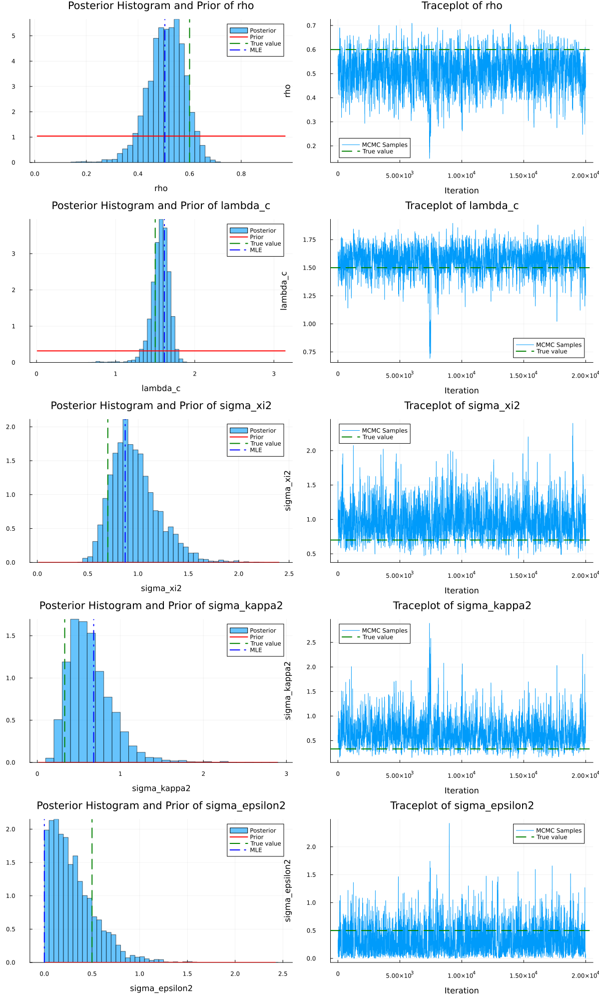

In [10]:
# Initialize a list to hold the plots
p_list = []

for i in 1:n_params
    param_samples = theta_samples_burned[:, i]
    
    # Histogram of posterior samples
    p1 = histogram(param_samples, bins=50, normalize=true, alpha=0.6,
                   label="Posterior", xlabel=parameters[i], ylabel="Density",
                   title="Posterior Histogram and Prior of $(parameters[i])")
    
    # Define the prior distribution
    if parameters[i] == "rho"
        # Uniform prior between 0 and 0.999
        a = a_rho
        b = b_rho
        x_values = range(a, b, length=200)
        prior_pdf = pdf.(Uniform(a, b), x_values)
    elseif parameters[i] == "lambda_c"
        # Uniform prior between 0 and π
        a = a_lambda
        b = b_lambda
        x_values = range(a, b, length=200)
        prior_pdf = pdf.(Uniform(a, b), x_values)
    else
        # Inverse-Gamma prior with a=3, b=1
        a_ig = a_epsilon
        b_ig = b_epsilon
        x_min = 0.0
        x_max = maximum(param_samples)
        x_values = range(x_min, x_max, length=200)
        prior_pdf = pdf.(InverseGamma(a_ig, b_ig), x_values)
    end
    
    # Overlay prior PDF on histogram
    plot!(p1, x_values, prior_pdf, label="Prior", color=:red, linewidth=2)
    
    # Include true parameter value
    vline!(p1, [params_true[i]], label="True value", color=:green, linestyle=:dash, linewidth=2)
    
    # MLE estimate
    vline!(p1, [estimated_params[i]], label="MLE", color=:blue, linestyle=:dashdot, linewidth=2)
    
    # Traceplot of MCMC samples
    p2 = plot(param_samples, label="MCMC Samples", xlabel="Iteration", ylabel=parameters[i],
              title="Traceplot of $(parameters[i])")
    hline!(p2, [params_true[i]], label="True value", color=:green, linestyle=:dash, linewidth=2)
    
    # Add plots to the list
    push!(p_list, p1)
    push!(p_list, p2)
end

# Display the plots in a grid layout
nrows = n_params
ncols = 2
plot(p_list..., layout=(nrows, ncols), size=(1200, 400 * n_params))


In [11]:
# Calculate means of posterior samples
chain_rec_burned_means = mean(theta_samples_burned, dims=1)  # 1 x n_params array
chain_rec_burned_means = vec(chain_rec_burned_means)  # Convert to a vector


5-element Vector{Float64}:
 0.5093761643058997
 1.5638725866329526
 0.9707195780116512
 0.6385264654550177
 0.3050080456156031

In [12]:

# Create the DataFrame
data = DataFrame(Dict(
    "Parameter" => parameters,
    "MCMC Estimate" => chain_rec_burned_means,
    "MLE Estimate" => estimated_params,  # Include if available
    "True Value" => params_true
))

# Display the DataFrame
display(data)


Row,MCMC Estimate,MLE Estimate,Parameter,True Value
,Float64,Float64,String,Float64
1,0.509376,0.504225,rho,0.6
2,1.56387,1.61624,lambda_c,1.5
3,0.97072,0.87237,sigma_xi2,0.7
4,0.638526,0.678888,sigma_kappa2,0.33
5,0.305008,1.00001e-6,sigma_epsilon2,0.5


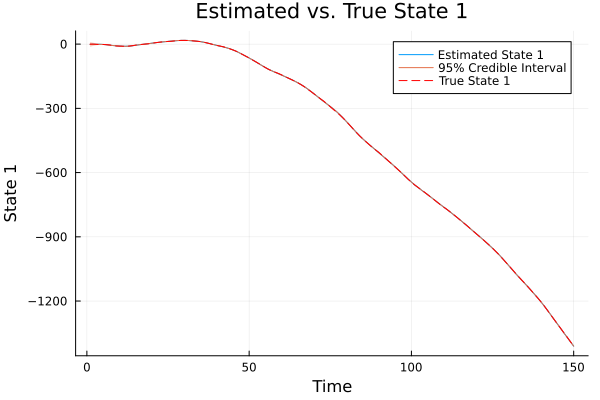

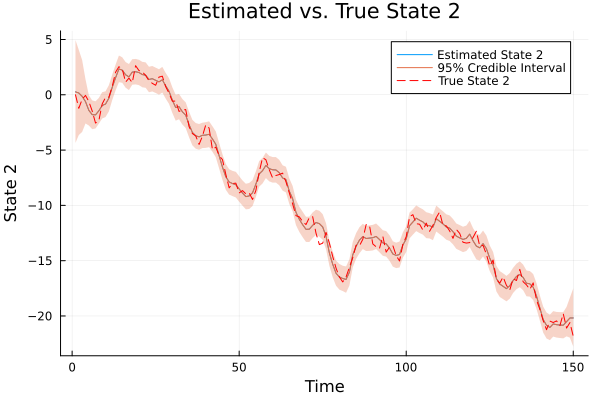

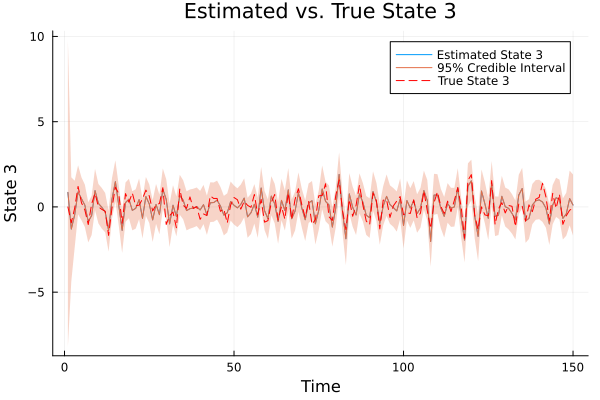

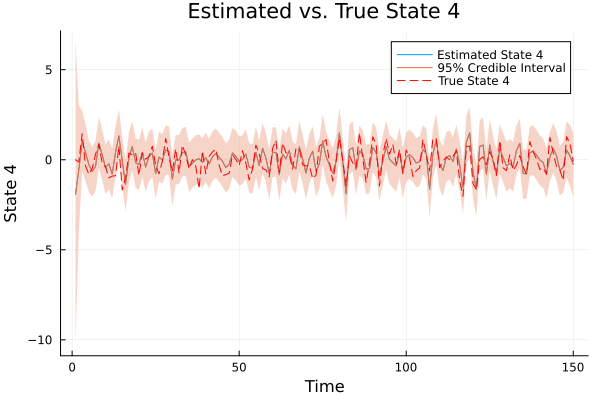

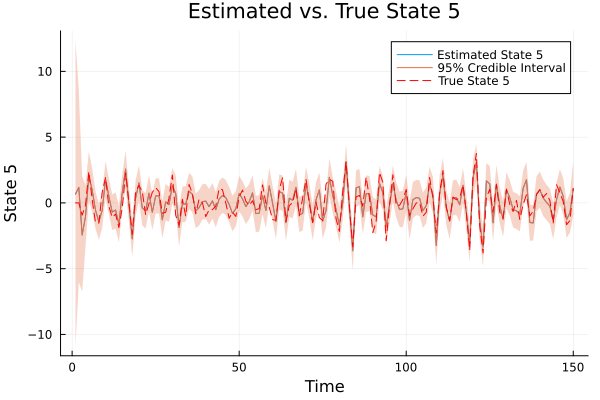

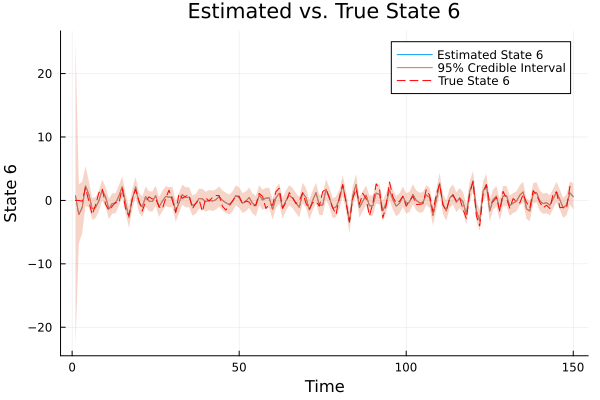

In [13]:
# Collect alpha samples into a 3D array
n_samples = length(alpha_samples)
n_time_steps = size(alpha_samples[1], 1)
state_dim = size(alpha_samples[1], 2)

# Initialize array to hold alpha samples
alpha_samples_array = Array{Float64}(undef, n_samples, n_time_steps, state_dim)

for i in 1:n_samples
    alpha_samples_array[i, :, :] = alpha_samples[i]
end


# Compute posterior mean over samples (dimension 1)
alpha_mean = mean(alpha_samples_array, dims=1)  # 1 x n_time_steps x state_dim
alpha_mean = dropdims(alpha_mean; dims=1)  # n_time_steps x state_dim

# Compute credible intervals
alpha_lower = mapslices(x -> quantile(x, 0.025), alpha_samples_array; dims=1)
alpha_lower = dropdims(alpha_lower; dims=1)
alpha_upper = mapslices(x -> quantile(x, 0.975), alpha_samples_array; dims=1)
alpha_upper = dropdims(alpha_upper; dims=1)



time = 1:n_time_steps

for s in 1:state_dim
    p = plot(time, alpha_mean[:, s], label="Estimated State $(s)", xlabel="Time",
             ylabel="State $(s)", title="Estimated vs. True State $(s)")
    
    # Add credible intervals using the `ribbon` argument
    plot!(time, alpha_mean[:, s], ribbon=(alpha_mean[:, s] .- alpha_lower[:, s],
          alpha_upper[:, s] .- alpha_mean[:, s]), fillalpha=0.3, label="95% Credible Interval")
    
    # Plot true state (assuming you have `alpha_true` from data simulation)
    plot!(time, alpha[1:n_time_steps, s], label="True State $(s)", linestyle=:dash, color=:red)
    
    display(p)
end


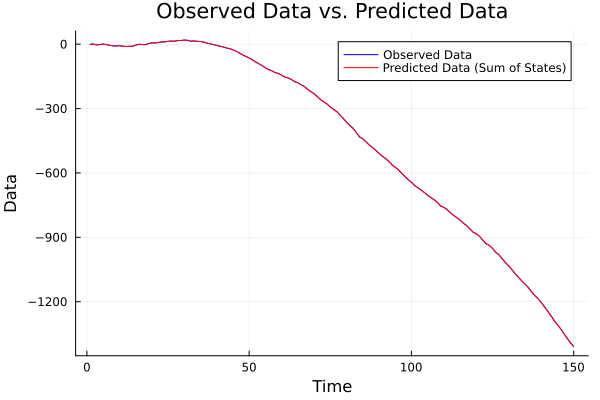

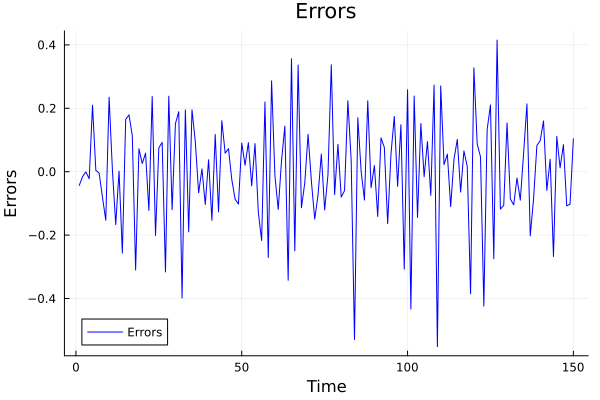

In [14]:
# Compute y_pred
# Adjust indices according to your state-space model
state_indices = [1, 2 + 2 * n_order-1]  

y_pred = alpha_mean[:, state_indices[1]] .+ alpha_mean[:, state_indices[2]]


# Adjust time and observed data if necessary
# If y_pred has fewer time points than y, adjust y accordingly
time = 1:length(y_pred)
y_adjusted = y[1:length(y_pred)]  # Adjust if lengths differ

p = plot(time, y_adjusted, label="Observed Data", color=:blue)
plot!(p, time, y_pred, label="Predicted Data (Sum of States)", color=:red)
xlabel!("Time")
ylabel!("Data")
title!("Observed Data vs. Predicted Data")
display(p)


errors = y_adjusted .- y_pred

p_error = plot(time, errors, label="Errors", color=:blue)
xlabel!("Time")
ylabel!("Errors")
title!("Errors")
display(p_error)
